# PRIMO - The P&A Project Optimizer
## Workflow Demo 

This notebook contains a demo of PRIMO - The P&A Project Optimizer. Utilizing the workflow in the image below, PRIMO reads in  input data on marginal wells and their characteristics and analyzes it with respect to **USER-DEFINED PRIORITIES AND PREFERENCES** to provide recommendations on the design of impactful and efficient P&A projects. 

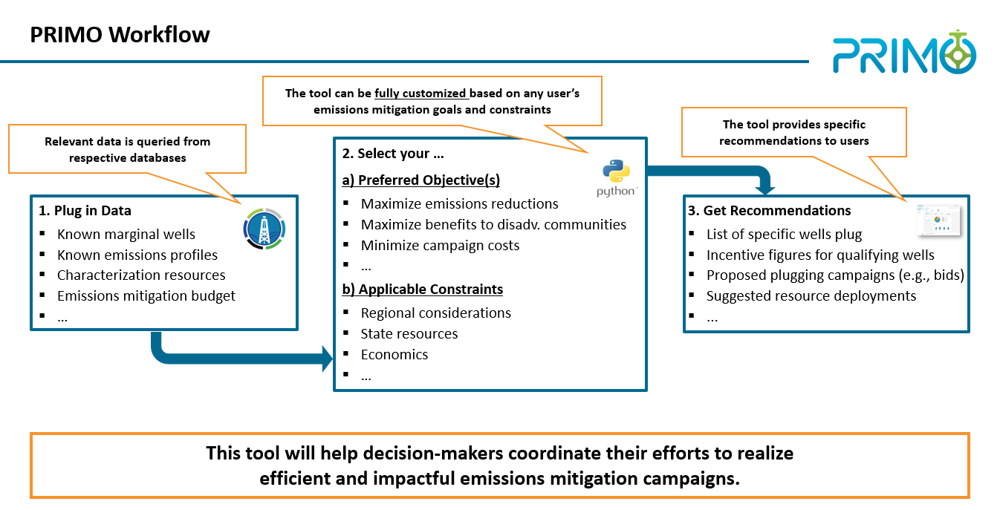

## Notice

This notebook is primarily meant to showcase the workflow and functionality of PRIMO. PRIMO is under active development: please reach out to primo@netl.doe.gov for questions, comments, feedback or feature requests.

In [1]:
# Imports from installed libraries
from IPython.display import display, Markdown
import folium
import pandas as pd

# PRIMO imports
from primo.data_parser import (
    EfficiencyMetrics,
    ImpactMetrics,
    WellDataColumnNames
)
from primo.data_parser.well_data import WellData
from primo.opt_model.result_parser import (
    EfficiencyCalculator,
    export_data_to_excel
)
from primo.opt_model.model_options import OptModelInputs
from primo.opt_model.result_parser import export_data_to_excel, Campaign
from primo.utils import setup_logger
from primo.utils.map_utils import VisualizeData 
from primo.utils.best_practice import distance_campaign

# Setup logger
setup_logger()
pd.set_option('display.precision',3)

## Impact Metric Selection

In [2]:
# Define impact metrics by creating an instance of ImpactMetrics class
im_metrics = ImpactMetrics()

# Specify weights
im_metrics.set_weight(
    primary_metrics={
        "ch4_emissions": 20,
        "sensitive_receptors": 20,
        "ann_production_volume": 15,
        "well_age": 15,
        "well_count": 15,
        "dac_impact": 15
    },
    submetrics={
        "dac_impact": {
            "state_dac": 100,
            "fed_dac": 0,
        },
        "ch4_emissions": {
            "leak": 50,
            "compliance": 0,
            "violation": 50,
            "incident": 0,
        },
        "sensitive_receptors": {
            "schools": 50,
            "hospitals": 50,
        },
        "ann_production_volume": {
            "ann_gas_production": 50,
            "ann_oil_production": 50,
        }
    }
)

# Check if the weights are valid or not
im_metrics.check_validity()

print(im_metrics)

                                                Metric Name  Metric weight
ch4_emissions                   Methane Emissions (Proxies)             20
dac_impact                   Disadvantaged Community Impact             15
sensitive_receptors                     Sensitive Receptors             20
ann_production_volume              Annual Production Volume             15
five_year_production_volume     Five-year Production Volume              0
well_age                                           Well Age             15
well_count                                 Owner Well Count             15
other_emissions                             Other Emissions              0
well_integrity               Well Integrity Issues [Yes/No]              0
environment                                     Environment              0
                                                      Total            100


Primary metric Methane Emissions (Proxies), with weight 20, has submetrics:
                 Subme

In [3]:
# (OPTIONAL) Metrics/submetrics that are not required can be deleted.
# This is an optional step. As long as their weight is set to zero, metric/submetrics
# that are not needed can still remain in the im_metrics object.
im_metrics.delete_metric("other_emissions")
im_metrics.delete_metric("five_year_production_volume")
im_metrics.delete_metric("well_integrity")
im_metrics.delete_metric("environment")

# Submetrics can also be deleted in a similar manner
im_metrics.delete_submetric("buildings_near")
im_metrics.delete_submetric("buildings_far")

print(im_metrics)

                                          Metric Name  Metric weight
ch4_emissions             Methane Emissions (Proxies)             20
dac_impact             Disadvantaged Community Impact             15
sensitive_receptors               Sensitive Receptors             20
ann_production_volume        Annual Production Volume             15
well_age                                     Well Age             15
well_count                           Owner Well Count             15
                                                Total            100


Primary metric Methane Emissions (Proxies), with weight 20, has submetrics:
                 Submetric Name  Submetric weight
leak              Leak [Yes/No]                50
compliance  Compliance [Yes/No]                 0
violation    Violation [Yes/No]                50
incident      Incident [Yes/No]                 0
                          Total               100


Primary metric Disadvantaged Community Impact, with weight 15, has s

In [4]:
# # Alternatively, use the widget to set weights
# im_metrics_widget = im_metrics.build_widget()
# im_metrics_widget.display()

In [5]:
# # Update weights from the widget
# im_metrics.set_weight_from_widget(im_metrics_widget)

## Efficiency Metric Selection

In [6]:
# Efficiency metrics can be set in a similar manner
eff_metrics = EfficiencyMetrics()

# Set weights for the metrics
eff_metrics.set_weight(
    primary_metrics={
        "num_wells": 15,
        "population_density": 15,
        "elevation_delta": 15,
        "dist_to_road": 15,
        "dist_range": 15,
        "age_range": 15,
        "depth_range": 10,
    }
)

# Check validity of the metrics
eff_metrics.check_validity()

# Print the updated metrics
print(eff_metrics)

                                          Metric Name  Metric weight
num_wells                             Number of Wells             15
num_unique_owners             Number of Unique Owners              0
elevation_delta                   Elevation Delta [m]             15
age_range                           Age Range [Years]             15
depth_range                          Depth Range [ft]             10
dist_range                     Distance Range [miles]             15
record_completeness               Record Completeness              0
dist_to_road                 Distance to Road [miles]             15
population_density   Total Population Density [#/km2]             15
                                                Total            100


In [7]:
# # Set weights using the widget
# eff_metrics_widget = eff_metrics.build_widget()
# eff_metrics_widget.display()

In [8]:
# # Update weights from the widget
# eff_metrics.set_weight_from_widget(eff_metrics_widget)

## Read Well Data

In [9]:
# Construct an object to store column names
col_names = WellDataColumnNames(
    well_id="Well Identifier",
    latitude="Latitude",
    longitude="Longitude",
    operator_name="Operator Name",
    age="Well Age",
    depth="Depth [ft]",

    leak="Leak validation",
    violation="Violation [Yes/No]",

    hospitals="Hospitals Within Distance",
    schools="Schools Within Distance",

    ann_gas_production="Gas Quantity",
    ann_oil_production="Oil Quantity",
    population_density="Population Density [#/km^2]",

    elevation_delta="Elevation Delta [m]",
    dist_to_road="Distance to Road [miles]",
    state_dac="Disadvantaged Communities",
    
)

# Create the well data object
wd = WellData(data="PA_public_data_not_web_app_violation_update_validation_no_duplicates.xlsx", column_names=col_names, impact_metrics=im_metrics, efficiency_metrics=eff_metrics)

primo: INFO: Reading the well data from the input file.
primo: INFO: Finished reading the well data.
primo: INFO: Beginning to perform preliminary data checks.
primo: INFO: Checking availability and uniqueness of well ids.
primo: INFO: Checking if latitude and longitude information is available for all wells.
primo: INFO: Checking if the operator name is available for all wells.
primo: INFO: Checking if age is available for all wells.
primo: INFO: Checking if depth is available for all wells.
primo: INFO: Checking if ann_gas_production is available for all wells.
primo: WARNING: Found empty cells in column Gas Quantity
primo: WARNING: Filling any empty cells in column Gas Quantity with value 0.0.
primo: INFO: Checking if ann_oil_production is available for all wells.
primo: WARNING: Found empty cells in column Oil Quantity
primo: WARNING: Filling any empty cells in column Oil Quantity with value 0.0.
primo: INFO: Completed processing the essential inputs.
primo: INFO: Finished prelimin

### Capability 1: Prioritizing Wells
The number of wells under consideration is significantly larger than what can be plugged with the budget available. Hence, we prioritize wells as per user-defined priorities to rank the candidate pool of wells.

In [10]:
wd.compute_priority_scores()

primo: INFO: Computing scores for metric/submetric well_age/Well Age.
primo: INFO: Computing scores for metric/submetric well_count/Owner Well Count.
primo: INFO: Computing scores for metric/submetric leak/Leak [Yes/No].
primo: INFO: Computing scores for metric/submetric violation/Violation [Yes/No].
primo: INFO: Computing scores for metric/submetric state_dac/State DAC.
primo: INFO: Computing scores for metric/submetric hospitals/Hospitals.
primo: INFO: Computing scores for metric/submetric schools/Schools.
primo: INFO: Computing scores for metric/submetric ann_gas_production/Annual Gas Production [in Mcf/Year].
primo: INFO: Computing scores for metric/submetric ann_oil_production/Annual Oil Production [in bbl/Year].
primo: INFO: Computing the total priority score.
primo: INFO: Completed the calculation of priority scores.


### MCW Population Visualization

In [11]:
import folium
from primo.utils.map_utils import VisualizeData

# Split the data data as oil and gas wells
gas_oil_wells = wd.get_gas_oil_wells


# Visualize wells
gas_wells = gas_oil_wells["gas"]   # WellData object
oil_wells = gas_oil_wells["oil"]   # WellData object

gas_gdf = gas_wells.data
oil_gdf = oil_wells.data

state_shapefile_url = "https://www.pasda.psu.edu/download/padot/boundary_layers/PaCounty2024_05.zip"
state_shapefile_name = "PaCounty2024_05.zip"
shp_name = "PaCounty2024_05.shp"

map_gas = VisualizeData(gas_wells, state_shapefile_url,state_shapefile_name,shp_name)
# map_gas.visualize_wells(well_type_to_plot = "Gas", map_title = "Gas Well Population", shapefile=True)

In [12]:
map_oil = VisualizeData(oil_wells, state_shapefile_url,state_shapefile_name,shp_name)
# map_oil.visualize_wells(well_type_to_plot = "Oil", map_title = "Oil Well Population", shapefile=True)

#### Outstanding: Filtering by MERP Volunteers

The MERP is a voluntary program for well owners.

#### Displaying High-Priority Wells

After applying all previously selected priority calculations, we display the highest-scoring wells below.


In [13]:
display(Markdown(
"""
#### Gas Wells by Priority Scores
"""
))

# List of columns to display
cols_to_display = [
    col_names.well_id, col_names.operator_name, col_names.age, col_names.depth, "Priority Score [0-100]"
]
for col in gas_gdf.columns:
    if 'Score' in col:
        cols_to_display.append(col)

top_gas_wells = gas_gdf.sort_values(by="Priority Score [0-100]", ascending=False)
display(top_gas_wells[cols_to_display].head(10))


#### Gas Wells by Priority Scores


,Well Identifier,Operator Name,Well Age,Depth [ft],Priority Score [0-100],Well Age Score [0-15],Owner Well-Count Score [0-15],Leak validation Score [0-10.0],Violation [Yes/No] Score [0-10.0],Disadvantaged Communities Score [0-15.0],Hospitals Within Distance Score [0-10.0],Schools Within Distance Score [0-10.0],Gas Quantity Score [0-7.5],Oil Quantity Score [0-7.5],Priority Score [0-100]
18423,039-20407,MILTON C PAYNE,52,3000,68.425,6.148,12.281,10.0,10.0,15.0,0.000,0.00,7.497,7.500,68.425
48178,063-20932,ANDY L & MARY E SCHLABACH,57,8000,60.330,6.762,13.573,0.0,10.0,15.0,0.000,0.00,7.496,7.500,60.330
15202,039-20094,ABRAM OIL CO,61,3000,59.005,7.254,12.281,0.0,10.0,15.0,0.000,0.00,7.372,7.098,59.005
37473,123-46107,BJS LLC,14,5000,58.111,1.475,12.281,0.0,10.0,15.0,3.333,1.25,7.489,7.283,58.111
37474,123-47128,BJS LLC,11,5000,57.742,1.107,12.281,0.0,10.0,15.0,3.333,1.25,7.489,7.283,57.742
24162,033-21128,DIVERSIFIED PROD LLC,43,8000,57.506,5.041,0.000,10.0,10.0,15.0,0.000,2.50,7.465,7.500,57.506
6456,005-28138,NORTHEASTERN OPR CO INC,18,7000,57.461,1.967,5.518,10.0,10.0,15.0,0.000,0.00,7.476,7.500,57.461
18424,039-20847,MILTON C PAYNE,44,3000,57.442,5.164,12.281,0.0,10.0,15.0,0.000,0.00,7.497,7.500,57.442
12201,063-27423,ECKENROD MARK S,41,8000,57.034,4.795,12.281,0.0,10.0,15.0,0.000,0.00,7.458,7.500,57.034
52065,105-00634,THOMPSON ROB R,99,6000,56.923,11.926,15.000,0.0,0.0,15.0,0.000,0.00,7.497,7.500,56.923


In [14]:
display(Markdown(
"""
#### Oil Wells by Priority Scores
"""
))

top_oil_wells = oil_gdf.sort_values(by="Priority Score [0-100]", ascending=False)
display(top_oil_wells[cols_to_display].head(10))


#### Oil Wells by Priority Scores


,Well Identifier,Operator Name,Well Age,Depth [ft],Priority Score [0-100],Well Age Score [0-15],Owner Well-Count Score [0-15],Leak validation Score [0-10.0],Violation [Yes/No] Score [0-10.0],Disadvantaged Communities Score [0-15.0],Hospitals Within Distance Score [0-10.0],Schools Within Distance Score [0-10.0],Gas Quantity Score [0-7.5],Oil Quantity Score [0-7.5],Priority Score [0-100]
41766,031-25659,ELLWOOD ENERGY INC,9,6000,55.665,0.861,15.000,0.0,10.0,15.0,0.0,0.0,7.498,7.307,55.665
51694,123-20448,H OIL LTD,61,4000,52.770,7.254,5.518,0.0,10.0,15.0,0.0,0.0,7.500,7.498,52.770
52724,053-27124,MINARD RUN OIL CO,25,6000,52.537,2.828,0.000,10.0,10.0,15.0,0.0,0.0,7.490,7.219,52.537
15170,083-49682,SCHREINER OIL & GAS INC,20,5000,52.073,2.213,0.028,10.0,10.0,15.0,0.0,0.0,7.497,7.335,52.073
15171,083-49683,SCHREINER OIL & GAS INC,20,5000,52.073,2.213,0.028,10.0,10.0,15.0,0.0,0.0,7.497,7.335,52.073
51697,123-22069,H OIL LTD,55,4000,52.032,6.516,5.518,0.0,10.0,15.0,0.0,0.0,7.500,7.498,52.032
51698,123-22070,H OIL LTD,55,4000,52.032,6.516,5.518,0.0,10.0,15.0,0.0,0.0,7.500,7.498,52.032
15226,039-20155,LINA M & ROBERT R STARK,60,3000,51.935,7.131,15.000,0.0,0.0,15.0,0.0,0.0,7.497,7.307,51.935
15179,083-49861,SCHREINER OIL & GAS INC,19,5000,51.824,2.090,0.028,10.0,10.0,15.0,0.0,0.0,7.495,7.212,51.824
15187,083-50022,SCHREINER OIL & GAS INC,19,5000,51.824,2.090,0.028,10.0,10.0,15.0,0.0,0.0,7.495,7.212,51.824


## Capability 2: Budget-Specific P&A Projects Optimization 
To determine high-impact, high-efficiency P&A within the available budget, we use an optimization model. The optimization carefully evaluates all possible combinations of wells for plugging projects and helps us select the best campaigns in a data-based, transparent and defensible way.

The goal of the optimization is to seek those P&A projects that are not only impactful but will also lead to the most efficient use of P&A resources. The impact of a P&A project is determined by the priority scores of the wells contained within (as per the calculations outline above). More information on the definition and calculation of the predicted efficiency of a P&A project is provided below.

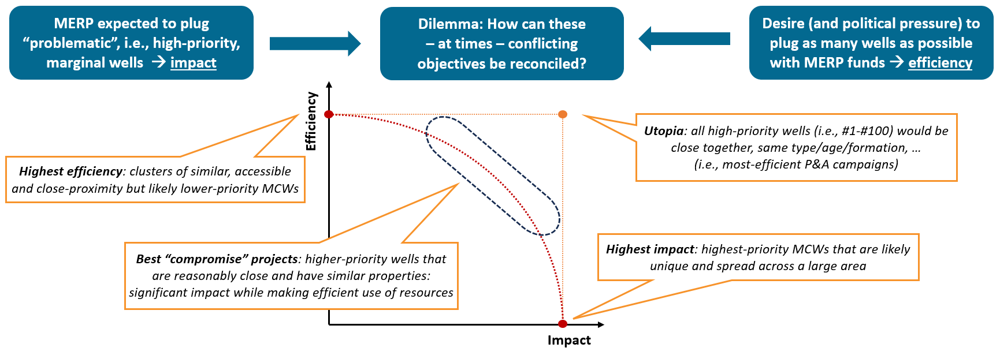

### State-Wide Program Constraints

In [15]:
from primo.opt_model.model_options import OptModelInputs

max_wells_per_owner = 1
threshold_distance = 10
total_budget = 4e6  # USD
#minimum number of wells in project
max_wells_in_project = 10
perc_wells_in_dac = 0
min_wells_in_project = 10

# Split the total budget proportionately between gas and oil wells
gas_budget = total_budget * (
    len(gas_gdf) / (len(oil_gdf) + len(gas_gdf))  # Fraction of gas wells in the dataset
)
oil_budget = total_budget * (
    len(oil_gdf) / (len(oil_gdf) + len(gas_gdf))  # Fraction of oil wells in the dataset
)


print(oil_budget, gas_budget)

# Mobilization costs
gas_mobilization_costs = {1: 120000, 2: 210000, 3: 280000, 4: 350000}
for n_wells in range(5, len(gas_gdf) + 1):
    gas_mobilization_costs[n_wells] = n_wells * 84000

oil_mobilization_costs = {1: 120000, 2: 210000, 3: 280000, 4: 350000}
for n_wells in range(5, len(oil_gdf) + 1):
    oil_mobilization_costs[n_wells] = n_wells * 84000


top_gas_wells = gas_wells.get_high_priority_wells(500)
top_oil_wells = oil_wells.get_high_priority_wells(500)

523278.2983787 3476721.7016213


In [16]:
gas_well_data_sub, gas_optimal_campaign, gas_plugging_cost, gas_cluster_map = distance_campaign(
    gas_wells,
    gas_budget,
    gas_mobilization_costs,
    max_wells_in_project,
    threshold_distance,
    top_gas_wells)
oil_well_data_sub, oil_optimal_campaign, oil_plugging_cost, oil_cluster_map = distance_campaign(
    oil_wells,
    oil_budget,
    oil_mobilization_costs,
    max_wells_in_project,
    threshold_distance,
    oil_wells)

In [17]:
# weight for optimization objective function term: objective_weight_impact=100,
gas_model_inputs = OptModelInputs(
    well_data=gas_well_data_sub,
    total_budget=gas_budget,
    mobilization_cost=gas_mobilization_costs,
    threshold_distance=threshold_distance,
    objective_weight_impact=100,
    max_wells_in_project=max_wells_in_project,
    cluster_mapping=gas_cluster_map
    #perc_wells_in_dac=perc_wells_in_dac,
)
# weight for optimization objective function term 100:0 now => change to 50 for 50:50 balance 
oil_model_inputs = OptModelInputs(
    well_data=oil_well_data_sub,
    total_budget=oil_budget,
    mobilization_cost=oil_mobilization_costs,    
    threshold_distance=threshold_distance,
    objective_weight_impact=100,
    max_wells_in_project=max_wells_in_project,
    cluster_mapping=oil_cluster_map
    # min_wells_in_project=min_wells_in_project,
    #perc_wells_in_dac=perc_wells_in_dac,
)

primo: INFO: Processing optimization model inputs.
primo: INFO: Skipping clustering step in OptModelInputs
primo: INFO: Finished processing optimization model inputs.
primo: INFO: Processing optimization model inputs.
primo: INFO: Skipping clustering step in OptModelInputs
primo: INFO: Finished processing optimization model inputs.


### P&A Gas Projects 

In [18]:
opt_campaign_gas = Campaign(gas_well_data_sub, gas_optimal_campaign, gas_plugging_cost, gas_model_inputs)

primo: INFO: Computing scaling factors for efficiency metrics
primo: WARNING: Scaling factor for the efficiency metric elevation_delta is not provided, so it is set to 134. To modify the scaling factor, pass argument max_elevation_delta while instantiating the OptModelInputs object.
primo: WARNING: Scaling factor for the efficiency metric dist_to_road is not provided, so it is set to 1.029842783. To modify the scaling factor, pass argument max_dist_to_road while instantiating the OptModelInputs object.
primo: WARNING: Scaling factor for the efficiency metric population_density is not provided, so it is set to 9306.553373. To modify the scaling factor, pass argument max_population_density while instantiating the OptModelInputs object.
primo: WARNING: Scaling factor for the efficiency metric age_range is not provided, so it is set to 121. To modify the scaling factor, pass argument max_age_range while instantiating the OptModelInputs object.
primo: WARNING: Scaling factor for the efficie

###  P&A Oil Projects

In [19]:
opt_campaign_oil = Campaign(oil_well_data_sub, oil_optimal_campaign, oil_plugging_cost, oil_model_inputs)

primo: INFO: Computing scaling factors for efficiency metrics
primo: WARNING: Scaling factor for the efficiency metric elevation_delta is not provided, so it is set to 205. To modify the scaling factor, pass argument max_elevation_delta while instantiating the OptModelInputs object.
primo: WARNING: Scaling factor for the efficiency metric dist_to_road is not provided, so it is set to 1.355461098. To modify the scaling factor, pass argument max_dist_to_road while instantiating the OptModelInputs object.
primo: WARNING: Scaling factor for the efficiency metric population_density is not provided, so it is set to 1291.332467. To modify the scaling factor, pass argument max_population_density while instantiating the OptModelInputs object.
primo: WARNING: Scaling factor for the efficiency metric age_range is not provided, so it is set to 78. To modify the scaling factor, pass argument max_age_range while instantiating the OptModelInputs object.
primo: WARNING: Scaling factor for the efficien

### Visualizing P&A projects

In [20]:
first_well_info_dict = opt_campaign_gas.get_project_well_information()

updated_first_well_info_dict = {}
for project_id, df in first_well_info_dict.items():
    df_copy = df.copy()
    df_copy['Project'] = project_id  # Add the project ID to each DataFrame
    updated_first_well_info_dict[project_id] = df_copy  # Store the updated DataFrame

# Concatenate the DataFrames from the first solution
selected_gas_wells = pd.concat(updated_first_well_info_dict.values())

map_gas.visualize_campaign(map_title = "Gas Well Projects", campaign=opt_campaign_gas, shapefile=True)


In [21]:
first_well_info_dict = opt_campaign_oil.get_project_well_information()

updated_first_well_info_dict = {}
for project_id, df in first_well_info_dict.items():
    df_copy = df.copy()
    df_copy['Project'] = project_id  # Add the project ID to each DataFrame
    updated_first_well_info_dict[project_id] = df_copy  # Store the updated DataFrame

selected_oil_wells = pd.concat(updated_first_well_info_dict.values())

map_oil.visualize_campaign(legend=True,map_title = "oil Well Projects", campaign=opt_campaign_oil, shapefile=True)


### RESULT: Summary of PRIMO-Recommended High-Impact, High-Efficiency P&A Gas Projects

In [22]:
opt_campaign_gas.set_efficiency_weights(eff_metrics)
opt_campaign_gas.compute_efficiency_scores()

primo: INFO: Computing overall efficiency score for project 1
primo: INFO: Computing overall efficiency score for project 2
primo: INFO: Computing overall efficiency score for project 3
primo: INFO: Computing overall efficiency score for project 4


In [23]:
print(opt_campaign_gas)

The optimal campaign has 4 projects.
The total cost of the campaign is $3,360,000

Number of wells in project 1		: 10
Estimated Project Cost			: $840,000
Impact Score [0-100]			: 40.29
Efficiency Score [0-100]		: 90.43

Number of wells in project 2		: 10
Estimated Project Cost			: $840,000
Impact Score [0-100]			: 39.54
Efficiency Score [0-100]		: 85.35

Number of wells in project 3		: 10
Estimated Project Cost			: $840,000
Impact Score [0-100]			: 41.12
Efficiency Score [0-100]		: 83.08

Number of wells in project 4		: 10
Estimated Project Cost			: $840,000
Impact Score [0-100]			: 34.32
Efficiency Score [0-100]		: 88.95




In [24]:
# display the information for each project
for project_id, project_data in opt_campaign_gas.get_project_well_information().items():
    display(f"Well information for Project {project_id} with efficiency score : {opt_campaign_gas.get_efficiency_score_project(project_id)}")
    display(project_data)

'Well information for Project 1 with efficiency score : 90.43329191514073'

,Well Rank,Well Identifier,Operator Name,Latitude,Longitude,Well Age,Depth [ft],Priority Score [0-100]
15003,1824,039-25070,KASTLE RESOURCES ENTERPRISES INC,41.832,-80.316,17,3000,41.412
15005,20318,039-25075,KASTLE RESOURCES ENTERPRISES INC,41.831,-80.310,17,3000,31.446
15006,20648,039-25144,KASTLE RESOURCES ENTERPRISES INC,41.827,-80.320,17,3000,31.283
15009,20190,039-25376,KASTLE RESOURCES ENTERPRISES INC,41.837,-80.320,16,3000,31.504
15012,19878,039-25427,KASTLE RESOURCES ENTERPRISES INC,41.836,-80.338,16,3000,31.623
15018,19837,039-25552,KASTLE RESOURCES ENTERPRISES INC,41.839,-80.328,16,3000,31.636
15022,21135,039-25688,KASTLE RESOURCES ENTERPRISES INC,41.833,-80.330,15,3000,30.536
18423,1,039-20407,MILTON C PAYNE,41.833,-80.321,52,3000,68.425
18424,8,039-20847,MILTON C PAYNE,41.832,-80.314,44,3000,57.442
18425,165,039-20628,MILTON C PAYNE,41.837,-80.326,45,3000,47.565


'Well information for Project 2 with efficiency score : 85.34640205074687'

,Well Rank,Well Identifier,Operator Name,Latitude,Longitude,Well Age,Depth [ft],Priority Score [0-100]
8794,10891,063-30975,FAIRMAN CORP,40.842,-79.047,30,8000,33.389
9891,2340,063-20545,HIGHPOINTE OIL & GAS LLC,40.851,-79.053,60,8000,38.375
30523,19258,063-35514,DIVERSIFIED PROD LLC,40.851,-79.047,17,8000,31.726
41531,9696,063-31277,CALDERA RESOURCES LLC,40.845,-79.046,29,8000,34.012
41532,9696,063-31278,CALDERA RESOURCES LLC,40.848,-79.046,29,8000,34.012
41533,9942,063-31636,CALDERA RESOURCES LLC,40.844,-79.051,28,8000,33.889
41535,463,063-33390,CALDERA RESOURCES LLC,40.848,-79.055,21,8000,44.265
41536,10395,063-35995,CALDERA RESOURCES LLC,40.845,-79.055,16,8000,33.650
48177,69,063-20844,ANDY L & MARY E SCHLABACH,40.847,-79.054,58,8000,51.704
48178,2,063-20932,ANDY L & MARY E SCHLABACH,40.847,-79.050,57,8000,60.330


'Well information for Project 3 with efficiency score : 83.07803859195654'

,Well Rank,Well Identifier,Operator Name,Latitude,Longitude,Well Age,Depth [ft],Priority Score [0-100]
14050,53,039-20164,GERALD W & ROBERTA G FULLER,41.755,-80.411,60,3000,52.128
15202,3,039-20094,ABRAM OIL CO,41.765,-80.394,61,3000,59.005
15203,344,039-23575,ABRAM OIL CO,41.765,-80.384,27,3000,44.900
15204,15,039-23528,ABRAM OIL CO,41.767,-80.390,27,3000,55.293
24766,2854,039-20095,DIVERSIFIED PROD LLC,41.763,-80.387,61,3000,37.246
44337,20557,039-25297,DIAMOND ENERGY PARTNERS LLC,41.740,-80.401,16,3000,31.345
48906,12264,039-23588,OWS ENERGY LLC,41.786,-80.402,26,3000,32.948
48941,13478,039-23468,OWS ENERGY LLC,41.743,-80.382,28,3000,32.713
48945,13848,039-23544,OWS ENERGY LLC,41.749,-80.377,27,3000,32.644
48947,12357,039-23593,OWS ENERGY LLC,41.742,-80.388,26,3000,32.934


'Well information for Project 4 with efficiency score : 88.94949736685632'

,Well Rank,Well Identifier,Operator Name,Latitude,Longitude,Well Age,Depth [ft],Priority Score [0-100]
12286,24884,123-33506,SOUTHWELL RUSSELL C,41.845,-79.170,41,5000,24.305
12287,24884,123-33507,SOUTHWELL RUSSELL C,41.844,-79.169,41,5000,24.305
12320,25018,123-40368,SOUTHWELL RUSSELL C,41.845,-79.168,36,5000,23.690
12321,25018,123-40369,SOUTHWELL RUSSELL C,41.845,-79.167,36,5000,23.690
12356,26135,123-43709,SOUTHWELL RUSSELL C,41.843,-79.168,19,5000,21.600
12368,3457,123-43710,SOUTHWELL RUSSELL C,41.842,-79.169,19,5000,36.600
12369,3457,123-43711,SOUTHWELL RUSSELL C,41.841,-79.170,19,5000,36.600
12370,3457,123-43712,SOUTHWELL RUSSELL C,41.841,-79.171,19,5000,36.600
37473,4,123-46107,BJS LLC,41.842,-79.167,14,5000,58.111
37474,5,123-47128,BJS LLC,41.842,-79.167,11,5000,57.742


### RESULT: Summary of PRIMO-Recommended High-Impact, High-Efficiency P&A Oil Projects

In [25]:
opt_campaign_oil.set_efficiency_weights(eff_metrics)
opt_campaign_oil.compute_efficiency_scores()

primo: INFO: Computing overall efficiency score for project 1


In [26]:
print(opt_campaign_oil)

The optimal campaign has 1 projects.
The total cost of the campaign is $504,000

Number of wells in project 1		: 6
Estimated Project Cost			: $504,000
Impact Score [0-100]			: 37.76
Efficiency Score [0-100]		: 91.90




In [27]:
for project_id, project_data in opt_campaign_gas.get_project_well_information().items():
    display(f"Well information for Project {project_id} with efficiency score : {opt_campaign_gas.get_efficiency_score_project(project_id)}")
    display(project_data)

'Well information for Project 1 with efficiency score : 90.43329191514073'

,Well Rank,Well Identifier,Operator Name,Latitude,Longitude,Well Age,Depth [ft],Priority Score [0-100]
15003,1824,039-25070,KASTLE RESOURCES ENTERPRISES INC,41.832,-80.316,17,3000,41.412
15005,20318,039-25075,KASTLE RESOURCES ENTERPRISES INC,41.831,-80.310,17,3000,31.446
15006,20648,039-25144,KASTLE RESOURCES ENTERPRISES INC,41.827,-80.320,17,3000,31.283
15009,20190,039-25376,KASTLE RESOURCES ENTERPRISES INC,41.837,-80.320,16,3000,31.504
15012,19878,039-25427,KASTLE RESOURCES ENTERPRISES INC,41.836,-80.338,16,3000,31.623
15018,19837,039-25552,KASTLE RESOURCES ENTERPRISES INC,41.839,-80.328,16,3000,31.636
15022,21135,039-25688,KASTLE RESOURCES ENTERPRISES INC,41.833,-80.330,15,3000,30.536
18423,1,039-20407,MILTON C PAYNE,41.833,-80.321,52,3000,68.425
18424,8,039-20847,MILTON C PAYNE,41.832,-80.314,44,3000,57.442
18425,165,039-20628,MILTON C PAYNE,41.837,-80.326,45,3000,47.565


'Well information for Project 2 with efficiency score : 85.34640205074687'

,Well Rank,Well Identifier,Operator Name,Latitude,Longitude,Well Age,Depth [ft],Priority Score [0-100]
8794,10891,063-30975,FAIRMAN CORP,40.842,-79.047,30,8000,33.389
9891,2340,063-20545,HIGHPOINTE OIL & GAS LLC,40.851,-79.053,60,8000,38.375
30523,19258,063-35514,DIVERSIFIED PROD LLC,40.851,-79.047,17,8000,31.726
41531,9696,063-31277,CALDERA RESOURCES LLC,40.845,-79.046,29,8000,34.012
41532,9696,063-31278,CALDERA RESOURCES LLC,40.848,-79.046,29,8000,34.012
41533,9942,063-31636,CALDERA RESOURCES LLC,40.844,-79.051,28,8000,33.889
41535,463,063-33390,CALDERA RESOURCES LLC,40.848,-79.055,21,8000,44.265
41536,10395,063-35995,CALDERA RESOURCES LLC,40.845,-79.055,16,8000,33.650
48177,69,063-20844,ANDY L & MARY E SCHLABACH,40.847,-79.054,58,8000,51.704
48178,2,063-20932,ANDY L & MARY E SCHLABACH,40.847,-79.050,57,8000,60.330


'Well information for Project 3 with efficiency score : 83.07803859195654'

,Well Rank,Well Identifier,Operator Name,Latitude,Longitude,Well Age,Depth [ft],Priority Score [0-100]
14050,53,039-20164,GERALD W & ROBERTA G FULLER,41.755,-80.411,60,3000,52.128
15202,3,039-20094,ABRAM OIL CO,41.765,-80.394,61,3000,59.005
15203,344,039-23575,ABRAM OIL CO,41.765,-80.384,27,3000,44.900
15204,15,039-23528,ABRAM OIL CO,41.767,-80.390,27,3000,55.293
24766,2854,039-20095,DIVERSIFIED PROD LLC,41.763,-80.387,61,3000,37.246
44337,20557,039-25297,DIAMOND ENERGY PARTNERS LLC,41.740,-80.401,16,3000,31.345
48906,12264,039-23588,OWS ENERGY LLC,41.786,-80.402,26,3000,32.948
48941,13478,039-23468,OWS ENERGY LLC,41.743,-80.382,28,3000,32.713
48945,13848,039-23544,OWS ENERGY LLC,41.749,-80.377,27,3000,32.644
48947,12357,039-23593,OWS ENERGY LLC,41.742,-80.388,26,3000,32.934


'Well information for Project 4 with efficiency score : 88.94949736685632'

,Well Rank,Well Identifier,Operator Name,Latitude,Longitude,Well Age,Depth [ft],Priority Score [0-100]
12286,24884,123-33506,SOUTHWELL RUSSELL C,41.845,-79.170,41,5000,24.305
12287,24884,123-33507,SOUTHWELL RUSSELL C,41.844,-79.169,41,5000,24.305
12320,25018,123-40368,SOUTHWELL RUSSELL C,41.845,-79.168,36,5000,23.690
12321,25018,123-40369,SOUTHWELL RUSSELL C,41.845,-79.167,36,5000,23.690
12356,26135,123-43709,SOUTHWELL RUSSELL C,41.843,-79.168,19,5000,21.600
12368,3457,123-43710,SOUTHWELL RUSSELL C,41.842,-79.169,19,5000,36.600
12369,3457,123-43711,SOUTHWELL RUSSELL C,41.841,-79.170,19,5000,36.600
12370,3457,123-43712,SOUTHWELL RUSSELL C,41.841,-79.171,19,5000,36.600
37473,4,123-46107,BJS LLC,41.842,-79.167,14,5000,58.111
37474,5,123-47128,BJS LLC,41.842,-79.167,11,5000,57.742


# Capability 3: P&A Project Efficiency Assessments
Ideal P&A projects not only include (many) high-priority wells but also prioritize the efficient use of available resources (e.g., budget, crews, equipment, ...). PRIMO has been designed to quantify the expected IMPACT and EFFICIENCY of recommended P&A candidate projects.

We employ a series of user-defined functions to calculate essential KPIs for each proposed P&A project.

- **Number of Wells**: The more wells a P&A project includes, the the more efficient plugging operations are expected to be - especially if the respective wells are close to each other. Note that upper limits on the number of wells per project may be imposed. Counted as the total number of wells associated with each project.

- **Well Proximities**: This KPI quantifies the "compactness" of any given P&A project. Wells close to each other lead to efficient plugging projects (e.g., reduced mobilization costs/efforts). Defined as the average absolute distance from well locations to the centroid of the project cluster.

- **Well Accessibility - Road Access**: The distance of any well to the closest road access point is used as a measure of well accessibility. The further a well is from any established road, the most costly it is presumed the P&A operation will be. Road construction cost can be significant contributor to project costs and efforts. Measured as the average absolute distance from well locations to their nearest road point. 

- **Well Accessibility - Elevation Change**: This KPI attempts to assess the accessibility of wells by comparing the elevation of the closest road access points to the elevation of the wells contained in a P&A project. If multiple wells in a project are characterized by significant elevation changes, they are presumed to be less accessible which increases P&A costs leading to inefficiencies. Computed as the average absolute elevation delta across all wells within the project group. The elevation delta is referred as the difference in surface elevation of the well and the elevation of the closest road access point. 

- **Well Characteristics - Age Range**: Wells with similar characteristics make for efficient P&A projects. As such, significant differences in well ages within a P&A project can pose challenges to P&A operations. The closer wells are in terms of age, the more efficient a P&A project is presumed to be. This metric Determined by subtracting the minimum age from the maximum age of wells within each P&A project. 

- **Well Characteristics - Depth Range**: Significant differences in well depths within a P&A project can pose challenges to P&A operations. The closer the wells are in terms of depth, the more efficient a P&A project is presumed to be. Calculated as the difference between the maximum and minimum depths of wells within the cluster. 

- **Number of Unique Well Owners**: As the number of (unique) well owners included in a given P&A project increases, so does the effort to manage a given project. Captured by counting the number of distinct company names associated with wells within each project.
 
- **Record Completeness**: The more data we have available on the well the easier it is to assess and group with other wells to form an efficient campaign. Captured by counting the number of columns with available data of a well within each project.

Upon computation of the KPIs for each P&A project, the next step is to scale these raw KPI values into standardized scores between 0 - 100 and then take the weighted average to calculate the **Efficiency Score** of the projects. 

## Efficiency Metrics for P&A Gas Projects

We calculate selected efficiency metrics for each plugging project:

In [28]:
efficiency_df = opt_campaign_gas.get_efficiency_metrics()
for col in efficiency_df.columns:
    if 'Accessibility Score' in col:
        efficiency_df = efficiency_df.drop(columns=[col])
display(efficiency_df)

,Project ID,Age Range Score [0-15],Depth Range Score [0-10],Dist Range Score [0-15],Dist To Road Score [0-15],Elevation Delta Score [0-15],Num Wells Score [0-15],Population Density Score [0-15],Efficiency Score [0-100]
0,1,10.413,10.0,12.792,12.364,14.888,15.0,14.976,90.433
1,2,9.545,10.0,13.977,10.770,11.082,15.0,14.972,85.346
2,3,9.421,10.0,10.259,9.105,14.328,15.0,14.964,83.078
3,4,11.281,10.0,14.461,12.782,12.090,15.0,13.336,88.949


Scaling these raw KPI values into standardized scores between 0 - 100 and taking the weighted average to calculate the **Efficiency Score** of the projects.

The final IMPACT and EFFICIENCY scores of the gas plugging projects are shown below:

In [29]:
display(opt_campaign_gas.get_campaign_summary())

,Project ID,Number of Wells,Impact Score [0-100],Efficiency Score [0-100]
0,1,10,40.287,90.433
1,2,10,39.535,85.346
2,3,10,41.116,83.078
3,4,10,34.324,88.949


## Efficiency Metrics for P&A Oil Projects

We calculate selected efficiency metrics for each plugging project:

In [30]:
efficiency_df = opt_campaign_oil.get_efficiency_metrics()
for col in efficiency_df.columns:
    if 'Accessibility Score' in col:
        efficiency_df = efficiency_df.drop(columns=[col])
display(efficiency_df)

,Project ID,Age Range Score [0-15],Depth Range Score [0-10],Dist Range Score [0-15],Dist To Road Score [0-15],Elevation Delta Score [0-15],Num Wells Score [0-15],Population Density Score [0-15],Efficiency Score [0-100]
0,1,14.423,10.0,15.0,14.449,14.195,9.0,14.833,91.9


Scaling these raw KPI values into standardized scores between 0 - 100 and taking the weighted average to calculate the **Efficiency Score** of the projects.

The final IMPACT and EFFICIENCY scores of the oil plugging projects are shown below:

In [31]:
display(opt_campaign_oil.get_campaign_summary())

,Project ID,Number of Wells,Impact Score [0-100],Efficiency Score [0-100]
0,1,6,37.762,91.9


## Saving PRIMO Results

We save the gas well and oil well projects in an excel file for each run. The default file name for the run is "Primo_Projects.xlsx".

In [32]:
output_file_path = "Primo_Projects.xlsx"
campaigns = [opt_campaign_gas, opt_campaign_oil]
campaign_labels = ["Gas", "Oil"]
export_data_to_excel(output_file_path, campaigns, campaign_labels)